In [25]:
%matplotlib inline
# libs for os and data manipulation
import os
import numpy as np
import pandas as pd
import deepdish

# libs for plotting
import bokeh
from bokeh.plotting import figure, output_file, show
from bokeh.io import output_notebook
from bokeh.models.tools import HoverTool
from bokeh.models import LinearColorMapper, ColorBar, BasicTicker, Select, PrintfTickFormatter
from bokeh.transform import jitter
from bokeh.sampledata.commits import data
from bokeh.palettes import brewer
import holoviews as hv
import time
from sklearn.manifold import TSNE
output_notebook()

Loading BokehJS ...

In [2]:
def read_nirdata(file,process_time = True, skiprows = 15):
    df = pd.read_csv(file, sep = '\t', skiprows = skiprows)
    df.columns = ['time','time_utc'] + df.columns.tolist()[2:]
    df.columns.name = 'wavelength'

    if process_time:
        df['time'] = pd.to_datetime(df.time_utc, unit='ms')
        df['rel_time'] = 0 
        dts = df.loc[1::,'time'].values - df.loc[0::-1,'time'].values
        dts = dts.astype(np.float64)/1e9
        df.loc[1::,'rel_time'] = dts
        df = df.set_index('rel_time')
        df.drop(['time', 'time_utc'],axis=1,inplace=True)
    return df

def plot_nirdata(data, mapper = None, 
                 xlabel = 'wavelength (nm)', ylabel = 'time (us)', color_label = None,
                 title = 'Intensity distribution',
                 px_width = 960, px_height = 500,
                 TOOLS = "hover,save,pan,box_zoom,reset,wheel_zoom"):
    if mapper is None:
        mapper = _gen_mapper(data)
    df = pd.DataFrame(data.stack(), columns=['Intensity']).reset_index()

    p = figure(plot_width=px_width, plot_height=px_height, title="Intensity distribution")
               #y_range=time, x_range=list(reversed(tcs)),
               #x_axis_location="below", plot_width=960, plot_height=600)

    p.grid.grid_line_color = None
    p.axis.axis_line_color = 'black'
    p.axis.major_tick_line_color = None
    p.axis.major_label_text_font_size = "5pt"
    p.axis.major_label_standoff = 10
    p.xaxis.major_label_orientation = 0
    p.xaxis.visible = True
    
    p.rect(y="index", x="wavelength", source=df,
           width=px_width/data.shape[1], height=px_height/data.shape[0], width_units="screen", height_units="screen",
           fill_color={'field': 'Intensity', 'transform': mapper},
           line_color=None)
    
    p.xaxis.axis_label = xlabel
    p.yaxis.axis_label = ylabel
    color_bar = ColorBar(color_mapper=mapper, major_label_text_font_size="5pt",
                         ticker=BasicTicker(desired_num_ticks=10),
                         formatter=PrintfTickFormatter(format="%f"),
                         label_standoff=6, border_line_color=None, location=(0, 0),
                         title = 'Intensity')
    p.add_layout(color_bar, 'right')
    
    hover = HoverTool()
    hover.tooltips=[
        ('t', '@index'),
        ('w', '@wavelength'),
        ('I', '@Intensity')
    ]

    p.add_tools(hover)

    show(p)
    del df
    return p

def _gen_mapper(df):
    imax = df.loc[:,:].max().max()
    imin = df.loc[:,:].min().min()
    mapper = LinearColorMapper(palette='Viridis256', 
                           low=imin, high=imax)
    return mapper

In [3]:
# define data location for in-line spectrometer
datapath = '/Volumes/extreme/repos/lab-data/laser-experiments/underwater-perf/LSsy-00013/oo-nir/'
nirfname = 'LSsy-00013_Subt2_15-11-11-449.txt'
nirfile  = os.path.join(datapath,nirfname)

In [4]:
df = read_nirdata(nirfile)
# get the lambda ranges
df.head()

wavelength,898.683,901.932,905.18,908.429,911.677,914.925,918.174,921.422,924.671,927.919,...,2530.722,2533.976,2537.229,2540.483,2543.737,2546.991,2550.245,2553.498,2556.752,2560.006
rel_time,,,,,,,,,,,,,,,,,,,,,
0.000,9.64,18.20,25.70,9.64,-9.64,32.12,10.71,23.55,13.92,14.99,...,4.28,10.71,0.00,-4.28,5.35,10.71,3.21,-3.21,5.35,0.00
0.027,10.71,27.84,4.28,11.78,-12.85,22.48,10.71,13.92,21.41,7.49,...,10.71,6.42,-6.42,-2.14,27.84,-8.57,7.49,9.64,4.28,4.28
0.034,12.85,23.55,13.92,16.06,-6.42,12.85,13.92,29.98,13.92,12.85,...,9.64,11.78,9.64,8.57,7.49,-2.14,11.78,-3.21,5.35,2.14
0.039,-2.14,27.84,19.27,14.99,-8.57,16.06,8.57,21.41,16.06,7.49,...,7.49,13.92,5.35,-2.14,12.85,-3.21,6.42,16.06,-7.49,14.99
0.044,16.06,20.34,16.06,2.14,4.28,9.64,21.41,10.71,16.06,14.99,...,9.64,8.57,2.14,0.00,24.63,11.78,6.42,4.28,13.92,-2.14


(37268, 512)


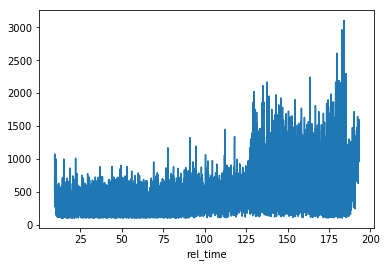

In [19]:
nirange = df.columns[2:].astype(np.float64)
rel_time = df.index.values.copy()
tindex = df.apply(np.average,axis=1).values>100
print(df.loc[tindex,:].shape)
df.loc[tindex,:].apply(np.average,axis=1).plot()

In [47]:
df
#df.columns.astype(np.int64)

wavelength,898.683,901.932,905.18,908.429,911.677,914.925,918.174,921.422,924.671,927.919,...,2530.722,2533.976,2537.229,2540.483,2543.737,2546.991,2550.245,2553.498,2556.752,2560.006
rel_time,,,,,,,,,,,,,,,,,,,,,
0.000,9.64,18.20,25.70,9.64,-9.64,32.12,10.71,23.55,13.92,14.99,...,4.28,10.71,0.00,-4.28,5.35,10.71,3.21,-3.21,5.35,0.00
0.027,10.71,27.84,4.28,11.78,-12.85,22.48,10.71,13.92,21.41,7.49,...,10.71,6.42,-6.42,-2.14,27.84,-8.57,7.49,9.64,4.28,4.28
0.034,12.85,23.55,13.92,16.06,-6.42,12.85,13.92,29.98,13.92,12.85,...,9.64,11.78,9.64,8.57,7.49,-2.14,11.78,-3.21,5.35,2.14
0.039,-2.14,27.84,19.27,14.99,-8.57,16.06,8.57,21.41,16.06,7.49,...,7.49,13.92,5.35,-2.14,12.85,-3.21,6.42,16.06,-7.49,14.99
0.044,16.06,20.34,16.06,2.14,4.28,9.64,21.41,10.71,16.06,14.99,...,9.64,8.57,2.14,0.00,24.63,11.78,6.42,4.28,13.92,-2.14
0.050,14.99,18.20,25.70,10.71,-16.06,13.92,13.92,21.41,13.92,11.78,...,13.92,11.78,0.00,-4.28,17.13,9.64,19.27,0.00,14.99,-3.21
0.057,14.99,18.20,16.06,18.20,1.07,17.13,4.28,14.99,19.27,13.92,...,7.49,6.42,2.14,-2.14,16.06,3.21,31.05,6.42,-3.21,3.21
0.062,11.78,4.28,9.64,12.85,-13.92,9.64,8.57,18.20,10.71,9.64,...,1.07,7.49,4.28,-1.07,14.99,2.14,11.78,8.57,18.20,-4.28
0.065,9.64,28.91,4.28,-3.21,-5.35,18.20,10.71,21.41,18.20,8.57,...,6.42,16.06,0.00,-9.64,17.13,8.57,9.64,12.85,16.06,-7.49


<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
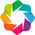

In [61]:
hv.extension('bokeh', 'matplotlib')
ds = hv.Dataset((np.arange(260), np.arange(512), df.loc[::250,:].T.values), ['x','y'],'values') 
#holoviews.HeatMap(df)

In [62]:
%opts Image (cmap='viridis')
ds.to(hv.Image, ['x', 'y'])

:Image   [x,y]   (values)

In [6]:
def log10(x):
    out = np.zeros(x.shape)
    out[x>0] = np.log10(x[x>0])
    out[x<=0] = 0
    return out

(94, 512)


<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
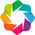

:Image   [x,y]   (values)

In [107]:
# Limestone
#data = df.iloc[tindex, nirange>1060].iloc[::250,::1].copy()
data = df.iloc[tindex,:].loc[::400,:].copy()
data.fillna(0,inplace=True)
data = data.apply(lambda x: log10(x)).copy()

print(data.shape)
hv.extension('bokeh', 'matplotlib')
ds = hv.Dataset((np.arange(data.shape[0]), 
                 np.round(df.columns.astype(np.float64),0), 
                 data.T.values), 
                 ['x','y'],'values') 

%opts Image (cmap='viridis')
%opts Image [width=960 height=500 ] 
ds.to(hv.Image, ['x', 'y'])

#mapper = _gen_mapper(data)
#p = plot_nirdata(data, mapper)

In [ ]:
# sandstone
data = df.iloc[tindex, nirange>1060].iloc[::50,::1].copy()
data.fillna(0,inplace=True)
data = data.apply(lambda x: log10(x)).copy()
mapper = _gen_mapper(data)
p = plot_nirdata(data, mapper)

In [8]:
#limestone
data = df.iloc[tindex, nirange>1100].iloc[::250,::1].copy()
data.fillna(0,inplace=True)
data = data.apply(lambda x: log10(x)).copy()
p = plot_nirdata(data,mapper)

In [9]:
# define data location for in-line spectrometer
datapath = '/Volumes/extreme/repos/lab-data/laser-experiments/underwater-perf/BG-00007/oo-nir/'
nirfname = 'BG-00007_Subt2_14-34-08-416.txt'
nirfile  = os.path.join(datapath,nirfname)
df = read_nirdata(nirfile)
# get the lambda ranges
df.head()

wavelength,898.683,901.932,905.18,908.429,911.677,914.925,918.174,921.422,924.671,927.919,...,2530.722,2533.976,2537.229,2540.483,2543.737,2546.991,2550.245,2553.498,2556.752,2560.006
rel_time,,,,,,,,,,,,,,,,,,,,,
0.000,9.64,13.92,-14.99,7.49,20.34,9.64,3.21,6.42,10.71,-5.35,...,12.85,-1.07,-2.14,-6.42,-16.06,-5.35,12.85,-21.41,-18.20,-4.28
0.025,1.07,14.99,-2.14,6.42,3.21,18.20,12.85,1.07,-6.42,12.85,...,20.34,-4.28,-4.28,-2.14,-6.42,2.14,0.00,2.14,-6.42,-5.35
0.030,1.07,11.78,5.35,-4.28,9.64,17.13,7.49,9.64,6.42,-1.07,...,16.06,4.28,-5.35,-3.21,-13.92,1.07,6.42,-10.71,-14.99,-1.07
0.035,10.71,20.34,3.21,17.13,6.42,10.71,5.35,-5.35,7.49,-9.64,...,14.99,-2.14,-5.35,-4.28,-1.07,-3.21,6.42,14.99,-6.42,-18.20
0.038,18.20,6.42,-9.64,7.49,11.78,17.13,7.49,10.71,12.85,3.21,...,11.78,0.00,0.00,0.00,2.14,5.35,9.64,-14.99,5.35,-9.64


In [12]:
nirange = df.columns[2:].astype(np.float64)
rel_time = df.index.values.copy()
tindex = df.apply(np.average,axis=1).values>100

In [13]:
#sandstone
data = df.iloc[tindex, nirange>1100].iloc[::100,::1].copy()
data.fillna(0,inplace=True)
data = data.apply(lambda x: log10(x)).copy()
p = plot_nirdata(data,mapper)

In [ ]:
range_bools = (nirange>1060)*(nirange<1085)
data = df.iloc[tindex, range_bools].iloc[::50,::1].copy()
data.fillna(0,inplace=True)
data = data.apply(lambda x: log10(x)).copy()
p = plot_nirdata(data, mapper)

In [ ]:
data = df.iloc[tindex,(nirange>1065)*(nirange<1070)].copy()
data.fillna(0,inplace=True)
data = data.apply(lambda x: log10(x)).copy()
#mapper = _gen_mapper(data)
data.columns = ['I']
p = figure(width = 960, height = 500, title = 'Laser line intensity')
p.scatter(x='rel_time', y = 'I', source=data, size=2, 
          color={'field': data.columns[0], 'transform': mapper})
p.xaxis.axis_label = 'Time (ms)'
p.yaxis.axis_label = 'Intensity'

color_bar = ColorBar(color_mapper=mapper, label_standoff=12, border_line_color=None, 
                     location=(0, 0),
                     ticker=BasicTicker())
hover = HoverTool()
hover.tooltips=[
    ('t', '@rel_time'),
    ('I', '@I')
]

p.add_tools(hover)
p.add_layout(color_bar, 'right')

show(p)

In [ ]:
# define data location for in-line spectrometer
datapath = '/Volumes/extreme/repos/lab-data/laser-experiments/matrix-optimization/LSsy-00008/oo-nir/'
nirfname = 'LSsy_00008-C-3_Subt2_14-32-23-702.txt'
nirfile  = os.path.join(datapath,nirfname)

In [ ]:
df = read_nirdata(nirfile)
# get the lambda ranges
df.head()

In [ ]:
#tindex = (df.index>9.972)*(df.index<20)
mapper = _gen_mapper(df)
tindex = df.apply(np.average,axis=1).values>50
data = df.iloc[tindex,(nirange>1065)*(nirange<1070)].copy()
data.columns = ['I']
p = figure(width = 960, height = 500, title = 'Laser line intensity')
p.scatter(x='rel_time', y = 'I', source=data, size=5, 
          color={'field': data.columns[0], 'transform': mapper})
p.xaxis.axis_label = 'Time (ms)'
p.yaxis.axis_label = 'Intensity'

color_bar = ColorBar(color_mapper=mapper, label_standoff=12, border_line_color=None, 
                     location=(0, 0),
                     ticker=BasicTicker())
hover = HoverTool()
hover.tooltips=[
    ('t', '@rel_time'),
    ('I', '@I')
]

p.add_tools(hover)
p.add_layout(color_bar, 'right')

show(p)

In [ ]:
tindex = (df.index>9.95)*(df.index<50)
data = df.iloc[tindex, nirange>1100].iloc[::100,::1].copy()
p = plot_nirdata(data)

In [ ]:
range_bools = ((nirange<=1100)*(nirange>=1060))
data = df.iloc[tindex, range_bools].iloc[::100,::1].copy()
p = plot_nirdata(data)

In [20]:
data = df.iloc[tindex, nirange>1060].iloc[::5,::1].copy()
data.fillna(0,inplace=True)
data = data.apply(lambda x: log10(x)).copy()

In [91]:
def _plot_tsne(tsne_results):
    if mapper is None:
         mapper = LinearColorMapper(palette='Viridis256', 
                           low=data.index.min(), high=data.index.max())

    p = figure(plot_width = 960, plot_height = 550)
    dtemp = pd.DataFrame({'x':tsne_results[:,0], 'y':tsne_results[:,1],'c':data.index.values})
    dtemp.head()
    p.scatter(x='x', y = 'y', source=dtemp, size=2, 
              color={'field': 'c', 'transform': mapper})
    show(p)
    
    return p 

def _tsne(data, ni=0, n_max=None, mapper=None):
    if n_max is None:
        n_max = data.shape[0]
    
    time_start = time.time()
    tsne = TSNE(n_components=2, verbose=1, perplexity=40, n_iter=300)
    tsne_results = tsne.fit_transform(data.iloc[ni:n_max].values)
    print('t-SNE done! Time elapsed: {} seconds'.format(time.time()-time_start))
    
    return tsne_results

def _get_data(datapath, nirfname,t_th = 50):
    nirfile  = os.path.join(datapath,nirfname)
    df = read_nirdata(nirfile)
    nirange = df.columns[2:].astype(np.float64)
    rel_time = df.index.values.copy()
    tindex = df.apply(np.average,axis=1).values>=t_th
    data = df.iloc[tindex,nirange>1100].copy()
    #data = df.iloc[tindex, nirange>1060].iloc[::250,::1].copy()
    data.fillna(0,inplace=True)
    data = data.apply(lambda x: log10(x)).copy()
    #mapper = _gen_mapper(data)
    #p = plot_nirdata(data, mapper)
    return data

In [90]:
# define data location for in-line spectrometer
datapath = '/Volumes/extreme/repos/lab-data/laser-experiments/matrix-optimization/LSsy-00008/oo-nir/'
nirfname = 'LSsy_00008-C-3_Subt2_14-32-23-702.txt'
data = _get_data(datapath, nirfname, t_th=0)
tsne_results = _tsne(data)

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 30272 samples in 0.704s...
[t-SNE] Computed neighbors for 30272 samples in 483.623s...
[t-SNE] Computed conditional probabilities for sample 1000 / 30272
[t-SNE] Computed conditional probabilities for sample 2000 / 30272
[t-SNE] Computed conditional probabilities for sample 3000 / 30272
[t-SNE] Computed conditional probabilities for sample 4000 / 30272
[t-SNE] Computed conditional probabilities for sample 5000 / 30272
[t-SNE] Computed conditional probabilities for sample 6000 / 30272
[t-SNE] Computed conditional probabilities for sample 7000 / 30272
[t-SNE] Computed conditional probabilities for sample 8000 / 30272
[t-SNE] Computed conditional probabilities for sample 9000 / 30272
[t-SNE] Computed conditional probabilities for sample 10000 / 30272
[t-SNE] Computed conditional probabilities for sample 11000 / 30272
[t-SNE] Computed conditional probabilities for sample 12000 / 30272
[t-SNE] Computed conditional probabilities for 

In [87]:
data

wavelength,1054.618,1057.867,1061.116,1064.365,1067.614,1070.863,1074.112,1077.361,1080.61,1083.859,...,2524.214,2527.468,2530.722,2533.976,2537.229,2540.483,2543.737,2546.991,2550.245,2553.498
rel_time,,,,,,,,,,,,,,,,,,,,,
9.977,3.265179,3.430535,3.575329,3.923690,4.181113,3.784610,2.776287,2.184975,1.862131,1.777862,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.631444,0.000000,0.000000,0.0
11.280,2.677032,2.834472,2.974134,3.313631,3.578654,3.194894,2.270190,1.710879,1.728597,1.573684,...,0.000000,0.000000,0.506505,0.000000,0.000000,0.000000,0.728354,0.000000,1.205746,0.0
12.580,2.709075,2.865341,3.006915,3.349173,3.613530,3.230503,2.277632,1.692406,1.597805,1.642465,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.476832,0.0
13.736,2.569982,2.708166,2.848534,3.189218,3.454206,3.071436,2.194015,1.663135,1.728597,1.652923,...,0.000000,0.000000,0.807535,0.000000,0.000000,0.000000,0.506505,0.000000,1.233757,0.0
15.052,2.385678,2.563683,2.685751,3.036545,3.301028,2.916707,2.054958,1.506776,1.476832,1.409933,...,0.000000,0.932981,0.000000,0.029384,0.000000,0.000000,0.330414,0.000000,1.071145,0.0
16.211,2.315214,2.511094,2.626248,2.966667,3.236746,2.851821,1.979047,1.476832,1.461048,1.427648,...,0.029384,0.932981,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.932981,0.0
17.517,2.097847,2.219977,2.364101,2.709075,2.989646,2.585957,1.692406,1.205746,0.728354,1.143639,...,0.000000,0.506505,0.000000,0.000000,0.000000,0.000000,0.000000,0.029384,0.000000,0.0
18.684,1.892985,2.007364,2.166371,2.500936,2.772373,2.362086,1.609488,0.000000,1.108903,1.108903,...,0.000000,0.506505,0.000000,0.000000,0.000000,0.874482,0.000000,0.000000,0.330414,0.0
19.994,1.842547,1.974143,2.150234,2.467401,2.756377,2.341395,1.561101,0.728354,0.330414,0.631444,...,0.000000,1.029789,0.000000,0.000000,0.000000,0.631444,0.000000,0.000000,0.874482,0.0


In [59]:
p = figure(plot_width = 960, plot_height = 550)
print(tsne_results.shape,data.index.shape)
dtemp = pd.DataFrame({'x':tsne_results[:,0], 'y':tsne_results[:,1],'c':data.index.values})
dtemp.head()
p.scatter(x='x', y = 'y', source=dtemp, size=2, 
          color={'field': 'c', 'transform': mapper})
show(p)

(7454, 2) (7454,)


In [35]:
n_sne = 1000

time_start = time.time()
tsne = TSNE(n_components=2, verbose=1, perplexity=40, n_iter=300)
tsne_results = tsne.fit_transform(data.iloc[:n_sne,:].values)

print('t-SNE done! Time elapsed: {} seconds'.format(time.time()-time_start))
p = figure()
p.scatter(x = tsne_results[:,0], y = tsne_results[:,1])
show(p)

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 1000 samples in 0.009s...
[t-SNE] Computed neighbors for 1000 samples in 0.774s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1000
[t-SNE] Mean sigma: 1.941064
[t-SNE] KL divergence after 250 iterations with early exaggeration: 69.141785
[t-SNE] Error after 300 iterations: 1.434580
t-SNE done! Time elapsed: 7.99773383140564 seconds


In [45]:
 mapper = LinearColorMapper(palette='Viridis256', 
                           low=data.index.min(), high=data.index.max())

In [37]:
n_sne = 3500

time_start = time.time()
tsne = TSNE(n_components=2, verbose=1, perplexity=40, n_iter=300)
tsne_results = tsne.fit_transform(data.iloc[:n_sne,:].values)

print('t-SNE done! Time elapsed: {} seconds'.format(time.time()-time_start))

p = figure()
p.scatter(x = tsne_results[:,0], y = tsne_results[:,1])
show(p)

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 3500 samples in 0.053s...
[t-SNE] Computed neighbors for 3500 samples in 8.363s...
[t-SNE] Computed conditional probabilities for sample 1000 / 3500
[t-SNE] Computed conditional probabilities for sample 2000 / 3500
[t-SNE] Computed conditional probabilities for sample 3000 / 3500
[t-SNE] Computed conditional probabilities for sample 3500 / 3500
[t-SNE] Mean sigma: 1.755944
[t-SNE] KL divergence after 250 iterations with early exaggeration: 76.297569
[t-SNE] Error after 300 iterations: 2.496761
t-SNE done! Time elapsed: 32.425694942474365 seconds


In [38]:
n_sne = 3500

time_start = time.time()
tsne = TSNE(n_components=2, verbose=1, perplexity=40, n_iter=300)
tsne_results = tsne.fit_transform(data.iloc[n_sne:-1,:].values)

print('t-SNE done! Time elapsed: {} seconds'.format(time.time()-time_start))

p = figure()
p.scatter(x = tsne_results[:,0], y = tsne_results[:,1])
show(p)

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 3953 samples in 0.068s...
[t-SNE] Computed neighbors for 3953 samples in 9.971s...
[t-SNE] Computed conditional probabilities for sample 1000 / 3953
[t-SNE] Computed conditional probabilities for sample 2000 / 3953
[t-SNE] Computed conditional probabilities for sample 3000 / 3953
[t-SNE] Computed conditional probabilities for sample 3953 / 3953
[t-SNE] Mean sigma: 1.786016
[t-SNE] KL divergence after 250 iterations with early exaggeration: 70.980568
[t-SNE] Error after 300 iterations: 1.979502
t-SNE done! Time elapsed: 41.32429599761963 seconds


In [ ]:
df.head()

In [ ]:
df['label']